# Computer Vision Project

## Part A [15 Marks]
**PROJECT OBJECTIVE: To build a face detection system**



####**1. Import and Understand the data**


##### A. Import and read ‘images.npy’


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import cv2
import seaborn as sns
from PIL import Image


import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout, Flatten
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam, SGD

from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix


from google.colab.patches import cv2_imshow

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
img_array = np.load('/content/drive/MyDrive/CV_GL/images.npy', allow_pickle=True)

In [ ]:
img_array.shape

(409, 2)

The npy file contains 409 images and their labels

In [ ]:
img_array[0][0]

array([[[42, 37, 34],
        [56, 51, 48],
        [71, 66, 63],
        ...,
        [23, 33, 34],
        [26, 36, 37],
        [28, 38, 39]],

       [[40, 35, 32],
        [51, 46, 43],
        [64, 59, 56],
        ...,
        [27, 36, 35],
        [24, 33, 32],
        [26, 35, 34]],

       [[43, 38, 35],
        [51, 46, 43],
        [61, 56, 53],
        ...,
        [28, 30, 27],
        [33, 35, 32],
        [35, 37, 34]],

       ...,

       [[56, 47, 40],
        [57, 48, 41],
        [61, 52, 45],
        ...,
        [67, 48, 42],
        [55, 35, 28],
        [60, 40, 33]],

       [[53, 44, 37],
        [54, 45, 38],
        [57, 48, 41],
        ...,
        [59, 40, 34],
        [60, 40, 33],
        [54, 34, 27]],

       [[53, 44, 37],
        [54, 45, 38],
        [57, 48, 41],
        ...,
        [59, 40, 34],
        [70, 50, 43],
        [64, 44, 37]]], dtype=uint8)

In [ ]:
img_array[0][1]

[{'label': ['Face'],
  'notes': '',
  'points': [{'x': 0.08615384615384615, 'y': 0.3063063063063063},
   {'x': 0.1723076923076923, 'y': 0.45345345345345345}],
  'imageWidth': 650,
  'imageHeight': 333},
 {'label': ['Face'],
  'notes': '',
  'points': [{'x': 0.583076923076923, 'y': 0.2912912912912913},
   {'x': 0.6584615384615384, 'y': 0.46846846846846846}],
  'imageWidth': 650,
  'imageHeight': 333}]

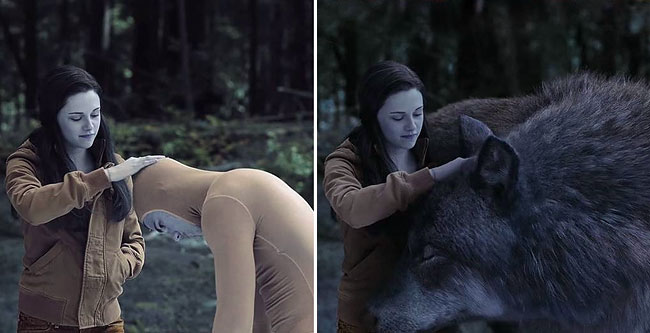

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img_array[0][0])

Read some images AND labels in the dataset

In [ ]:
df = img_array.copy()

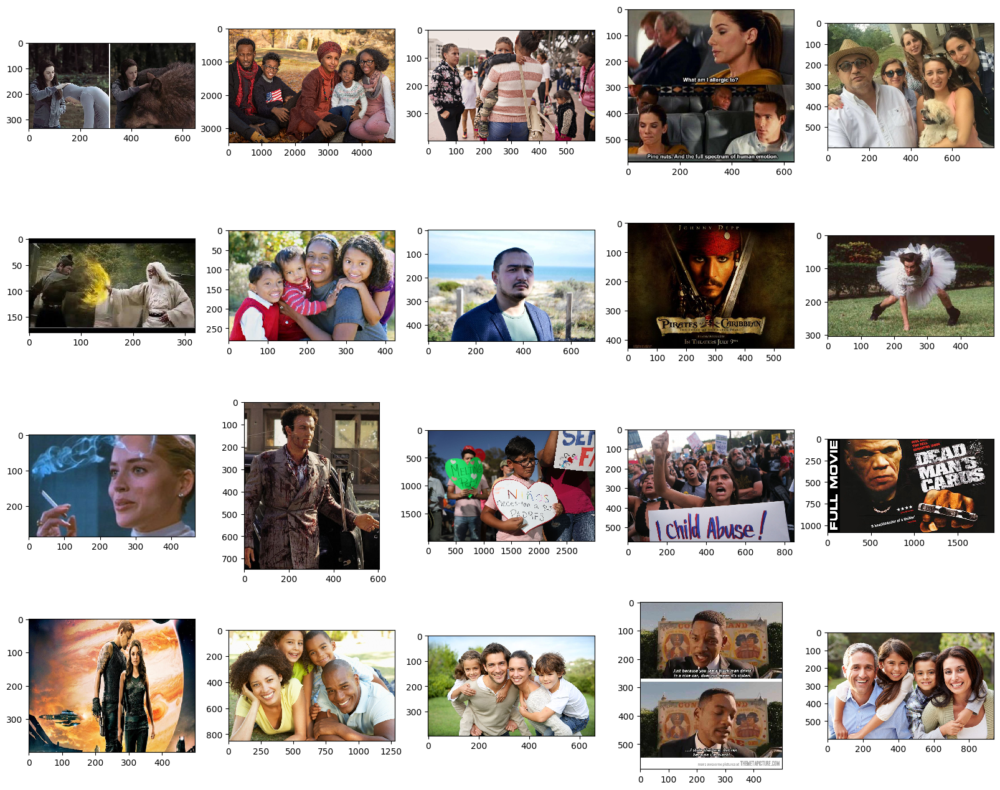

In [ ]:
fi,ax = plt.subplots(4, 5, figsize=(20, 16))
row = 0
col = 0
index = 0
for i in range(20):
  ax[row][col].imshow(df[index][0], interpolation='nearest')
  index = index + 12
  col = col + 1
  if col > 4:
    row = row + 1
    col = 0
plt.show()

##### B. Split the data into Features(X) & labels(Y). Unify shape of all the images

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet import preprocess_input

IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224

HEIGHT_CELLS = 28
WIDTH_CELLS = 28

IMAGE_SIZE = 224

masks = np.zeros((int(df.shape[0]), IMAGE_HEIGHT, IMAGE_WIDTH))
X = np.zeros((int(df.shape[0]),IMAGE_HEIGHT, IMAGE_WIDTH, 3))

for index in range(df.shape[0]):
  img = df[index][0]
  img = cv2.resize(img, dsize=(IMAGE_HEIGHT, IMAGE_WIDTH), interpolation=cv2.INTER_CUBIC)
  try:
    img = img[:,:,:3]
  except:
    print(f"Exception {index} Grayscale image with shape {img.shape}")
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    continue
  X[index] = preprocess_input(np.array(img, dtype=np.float32))
  for i in df[index][1]:
    x1 = int(i['points'][0]['x'] * IMAGE_WIDTH)
    x2 = int(i['points'][1]['x'] * IMAGE_WIDTH)
    y1 = int(i['points'][0]['y'] * IMAGE_HEIGHT)
    y2 = int(i['points'][1]['y'] * IMAGE_HEIGHT)
    # setting all the pixels within the mask co-ordinates to 1.
    masks[index][y1:y2, x1:x2] = 1
print(f"Shape of Features(X) is '{X.shape}' and the shape of labels(Y) mask is '{masks.shape}' ")

Exception 272 Grayscale image with shape (224, 224)
Shape of Features(X) is '(409, 224, 224, 3)' and the shape of labels(Y) mask is '(409, 224, 224)' 


##### C. Split the data into train and test[400:9].

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, masks, test_size=0.02, random_state=40)

print(f"Shape of X_train is '{X_train.shape}' and the shape of y_train is '{y_train.shape}'")
print(f"Shape of X_test is '{X_test.shape}' and the shape of y_test is '{y_test.shape}'")

Shape of X_train is '(400, 224, 224, 3)' and the shape of y_train is '(400, 224, 224)'
Shape of X_test is '(9, 224, 224, 3)' and the shape of y_test is '(9, 224, 224)'


##### D. Select random image from the train data and display original image and masked image


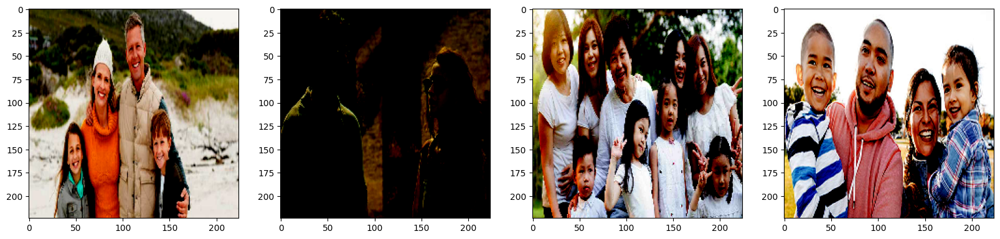

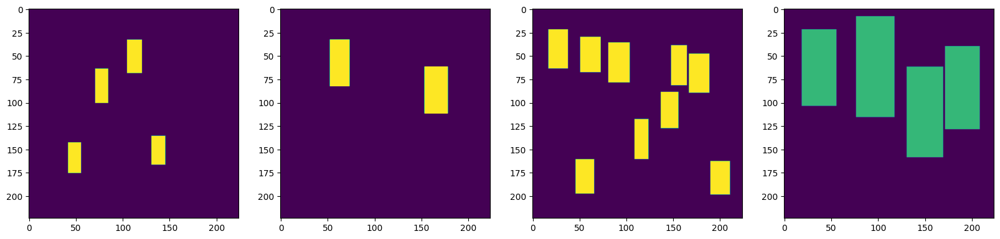

In [ ]:
fig = plt.figure(figsize=(20, 20))
a = fig.add_subplot(1, 4, 1)
imgplot = plt.imshow(X_train[0])

a = fig.add_subplot(1, 4, 2)
imgplot = plt.imshow(X_train[1])
imgplot.set_clim(0.0, 0.5)

a = fig.add_subplot(1, 4, 3)
imgplot = plt.imshow(X_train[2])
imgplot.set_clim(0.0, 1)

a = fig.add_subplot(1, 4, 4)
imgplot = plt.imshow(X_train[3])
imgplot.set_clim(0.0, 1.5)

fig = plt.figure(figsize=(20, 20))
a = fig.add_subplot(1, 4, 1)
imgplot = plt.imshow(y_train[0])

a = fig.add_subplot(1, 4, 2)
imgplot = plt.imshow(y_train[1])
imgplot.set_clim(0.0, 0.5)

a = fig.add_subplot(1, 4, 3)
imgplot = plt.imshow(y_train[2])
imgplot.set_clim(0.0, 1)

a = fig.add_subplot(1, 4, 4)
imgplot = plt.imshow(y_train[3])
imgplot.set_clim(0.0, 1.5)

#### 2. Model building

##### A. Design a face mask detection model


In [ ]:
img_size = 224
epochs = 5
batch = 8
LR = 1e-4

In [ ]:
from keras.layers import Concatenate

In [ ]:
def model():
    inputs = Input(shape=(img_size, img_size, 3), name="input_image")

    encoder = MobileNetV2(input_tensor=inputs, weights="imagenet", include_top=False, alpha=0.35)
    skip_connection_names = ["input_image", "block_1_expand_relu", "block_3_expand_relu", "block_6_expand_relu"]
    encoder_output = encoder.get_layer("block_13_expand_relu").output

    f = [16, 32, 48, 64]
    x = encoder_output
    for i in range(1, len(skip_connection_names)+1, 1):
        x_skip = encoder.get_layer(skip_connection_names[-i]).output
        x = UpSampling2D((2, 2))(x)
        x = Concatenate()([x, x_skip])
        x = Conv2D(f[-i], (3, 3), padding="same")(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)
        x = Conv2D(f[-i], (3, 3), padding="same")(x)
        x = BatchNormalization()(x)
        x = Activation("relu")(x)

    x = Conv2D(1, (1, 1), padding="same")(x)
    x = Activation("sigmoid")(x)

    model = Model(inputs, x)
    return model

In [ ]:
from tensorflow.keras.layers import UpSampling2D
import keras.layers as layers
from keras.layers import Input, Conv2D, BatchNormalization, Activation, UpSampling2D, Concatenate
from keras.models import Model
from keras.applications import MobileNetV2

In [ ]:
model = model()
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_image (InputLayer)       [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 16  432         ['input_image[0][0]']            
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 16  64          ['Conv1[0][0]']                  
                                )                                                           

##### B. Design your own Dice Coefficient and Loss function

In [ ]:
smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

#####C. Train and tune the model as required

In [ ]:
from tensorflow.keras.metrics import Recall, Precision

In [ ]:
opt = tf.keras.optimizers.Nadam(LR)
metrics = [dice_coef, Recall(), Precision()]
model.compile(loss=dice_loss, optimizer=opt, metrics=metrics)

In [ ]:
train_steps = len(X_train)//batch

if len(X_train) % batch != 0:
    train_steps += 1


model.fit(
    X_train, y_train,
    epochs=epochs,
    steps_per_epoch=train_steps,
)

Epoch 1/5
50/50 [==============================] - 213s 4s/step - loss: 0.4248 - dice_coef: 0.5752 - recall_2: 0.9030 - precision_2: 0.6351
Epoch 2/5
50/50 [==============================] - 211s 4s/step - loss: 0.4120 - dice_coef: 0.5880 - recall_2: 0.9034 - precision_2: 0.6549
Epoch 3/5
50/50 [==============================] - 211s 4s/step - loss: 0.3928 - dice_coef: 0.6072 - recall_2: 0.9086 - precision_2: 0.6730
Epoch 4/5
50/50 [==============================] - 210s 4s/step - loss: 0.3868 - dice_coef: 0.6132 - recall_2: 0.9028 - precision_2: 0.6845
Epoch 5/5
50/50 [==============================] - 211s 4s/step - loss: 0.3703 - dice_coef: 0.6297 - recall_2: 0.9075 - precision_2: 0.6978


##### D. Evaluate and share insights on performance of the model


In [ ]:
test_steps = (len(X_test)//batch)
if len(X_test) % batch != 0:
    test_steps += 1

model.evaluate(X_test, y_test, steps=test_steps)

2/2 [==============================] - 1s 365ms/step - loss: 0.5096 - dice_coef: 0.4819 - recall_2: 0.7811 - precision_2: 0.5129


[0.5096245408058167,
 0.48193395137786865,
 0.7810777425765991,
 0.5128594636917114]

Model has recall 78%, Precision of 51%, loss 50% and dice coefficient is 48%.

#### **3. Test the model predictionson the test image: ‘image with index 3 in the test data’ and visualise the predicted mask son the faces in the image.**

In [ ]:
y_pred = model.predict(np.array([X_test[3]]))
y_pred

1/1 [==============================] - 0s 276ms/step


array([[[[0.2773635 ],
         [0.19425039],
         [0.15916677],
         ...,
         [0.0928473 ],
         [0.10899308],
         [0.13571581]],

        [[0.11768847],
         [0.09386556],
         [0.10462047],
         ...,
         [0.06187226],
         [0.06785089],
         [0.09277959]],

        [[0.10129548],
         [0.07592214],
         [0.07335552],
         ...,
         [0.07770234],
         [0.0705699 ],
         [0.10198894]],

        ...,

        [[0.07597376],
         [0.06245282],
         [0.06254477],
         ...,
         [0.10448864],
         [0.07830963],
         [0.11559232]],

        [[0.0727247 ],
         [0.05174813],
         [0.05753801],
         ...,
         [0.10392925],
         [0.08690614],
         [0.1796092 ]],

        [[0.07241064],
         [0.05946891],
         [0.06601708],
         ...,
         [0.14839926],
         [0.19487627],
         [0.15806821]]]], dtype=float32)

In [ ]:
pred_mask = cv2.resize((1.0*(y_pred[0] > 0.5)), (IMAGE_WIDTH,IMAGE_HEIGHT))

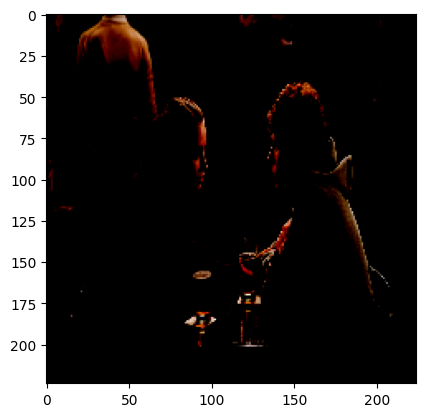

In [ ]:
plt.imshow(X_test[3])

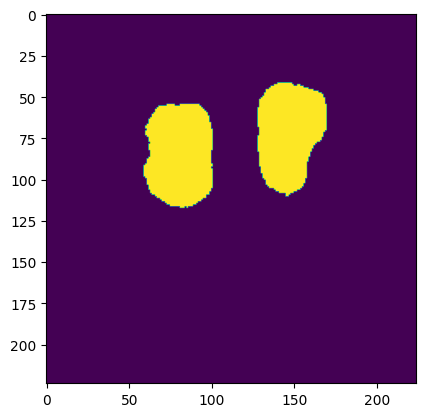

In [ ]:
plt.imshow(pred_mask)

Model detected faces correctly.

####**Summary**
An image processing system was developed employing a U-Net structure with skip connections, integrating the MobileNetV2 backbone for precise image segmentation. The system exhibited 78% accuracy and 51% precision with a 50% loss rate and a 48% dice coefficient. It successfully identified faces within test images.

## Part B [10 Marks]


#####**1. Read/import images from folder ‘training_images’.**

In [ ]:
from tqdm.notebook import trange, tqdm
from IPython.display import Image, display, Markdown, clear_output
from zipfile import ZipFile

In [ ]:
project_path = '/content/'
images_zip_path = '/content/drive/MyDrive/training_images-20211126T092819Z-001.zip'
from zipfile import ZipFile

with ZipFile(images_zip_path, 'r') as z:
  z.extractall()

In [ ]:
zip_dir_loc = z.filelist[0].filename.split("/")[0]
zip_dir_loc

'training_images'

In [ ]:
raw_img_file_names = [os.path.join(zip_dir_loc,i) for i in os.listdir(zip_dir_loc)]
raw_img_file_names[:5]

['training_images/real_00120.jpg',
 'training_images/real_00670.jpg',
 'training_images/real_00631.jpg',
 'training_images/real_00090.jpg',
 'training_images/real_00650.jpg']

##### **2. Write a loop which will iterate through all the images in the ‘training_images’folder and detect the faces present on all the images.**

In [ ]:
img_list = []
for imgs in tqdm(raw_img_file_names):
  tst_img = cv2.imread(imgs)
  img_list.append(tst_img)
img_list = np.array(img_list)
display(Markdown(f"{img_list.shape}"))

  0%|          | 0/1091 [00:00<?, ?it/s]

(1091, 600, 600, 3)

There's a collection of 1091 colored images, each with dimensions of 600 x 600 pixels, featuring RGB channels (indicating colored images, not grayscale).







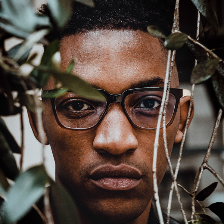

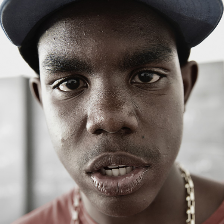

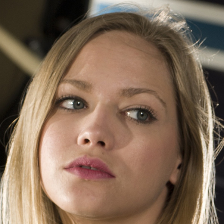

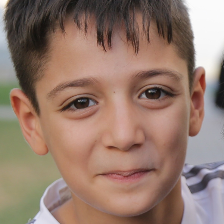

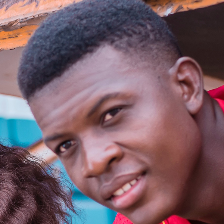

In [ ]:
from google.colab.patches import cv2_imshow

for i in img_list[:5,]:
  cv2_imshow(cv2.resize(i,(224,224)))

In [ ]:
# bounding box
def test_bb(df,fname,title=""):

  tst_img = cv2.imread(fname)
  temp_df = df[df['Image_Name'] == fname]
  rect_img = []
  for rows in temp_df.index:
    x = df['x'][rows]
    y = df['y'][rows]
    w = df['w'][rows]
    h = df['h'][rows]
    cv2.rectangle(tst_img,(x,y),(x+w,y+h),(255,0,0),2)
    cv2.putText(tst_img, title, (int((x+w)*0.75),y-3),cv2.FONT_HERSHEY_SIMPLEX,0.5,(0,0,255))
  cv2_imshow(tst_img)

  return

In [ ]:
def show_face(img_list,scale=1.0):

  for imgs in img_list:
    img = cv2.imread(imgs)
    img_w  = int(img.shape[1]*scale)
    img_h = int(img.shape[0]*scale)
    img = cv2.resize(img,(img_w,img_h))
    display(Markdown(f"#### {imgs}"))
    cv2_imshow(img)

  return

In [ ]:
# deploying haarcascade_frontalface_default.xml
!wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml

--2023-12-17 15:36:21--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘haarcascade_frontalface_default.xml.2’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.05s   

2023-12-17 15:36:21 (18.3 MB/s) - ‘haarcascade_frontalface_default.xml.2’ saved [930127/930127]



Bounding Box parameters are `x`:72, `y`:99, `width`:466, `height`:466

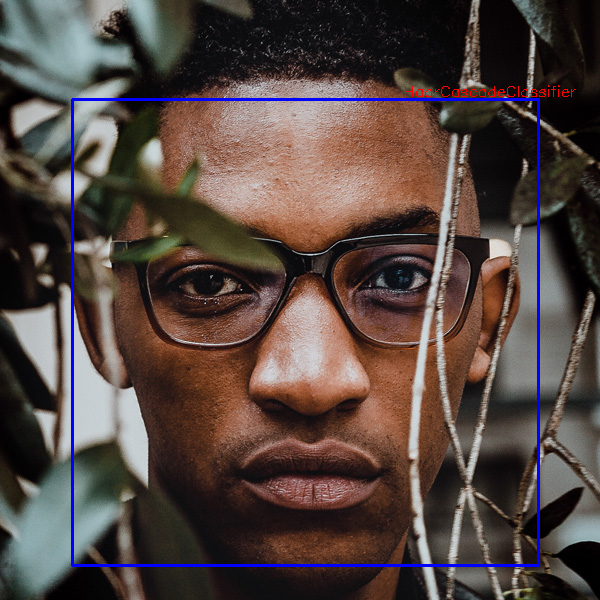

In [ ]:


face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

test_img = cv2.imread(raw_img_file_names[0])
grey = cv2.cvtColor(test_img, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(grey,1.1,4)

for (x, y, w, h) in faces:
  cv2.rectangle(test_img, (x, y), (x+w, y+h), (255, 0, 0), 2)
  cv2.putText(test_img, "HaarCascadeClassifier", (int((x+w)*0.75),y-3),cv2.FONT_HERSHEY_SIMPLEX,0.5,(0,0,255))

# output
display(Markdown(f"Bounding Box parameters are `x`:{x}, `y`:{y}, `width`:{w}, `height`:{h}"))
cv2_imshow(test_img)

In [ ]:
# dataframe creation
img_box_df = pd.DataFrame(columns=['x','y','w','h','Total_Faces','Image_Name'])
img_box_df

,x,y,w,h,Total_Faces,Image_Name


In [ ]:


%%time
undetected_images = []
detected_images = []

for imgs, fnames in tqdm(zip(img_list,raw_img_file_names)):
  gray = cv2.cvtColor(imgs,cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(gray,1.1,4)
  if len(faces) == 0:
    undetected_images.append(fnames)
    temp_dict = {'x':0,
                 'y':0,
                 'w':-1,
                 'h':-1,
                 'Total_Faces':0,
                 'Image_Name':fnames}
  else:
    detected_images.append(fnames)
    for (x,y,w,h) in faces:
      temp_dict = {'x':x,
                  'y':y,
                  'w':w,
                  'h':h,
                  'Total_Faces':len(faces),
                  'Image_Name':fnames}
      img_box_df = img_box_df.append(temp_dict,ignore_index=True)
display(Markdown(f"Detected faces for {len(detected_images)} images"))
display(Markdown(f"Failed to detect faces for {len(undetected_images)} images"))

0it [00:00, ?it/s]

Detected faces for 930 images

Failed to detect faces for 161 images

CPU times: user 6min 26s, sys: 4.56 s, total: 6min 30s
Wall time: 4min 12s


#####**3. From the same loop above,extract metadata of the faces and write into a DataFrame.**

In [ ]:
img_box_df

,x,y,w,h,Total_Faces,Image_Name
0,72,99,466,466,1,training_images/real_00120.jpg
1,37,33,483,483,1,training_images/real_00670.jpg
2,48,119,433,433,1,training_images/real_00631.jpg
3,70,77,480,480,1,training_images/real_00090.jpg
4,384,109,61,61,1,training_images/real_00650.jpg
...,...,...,...,...,...,...
1006,86,152,388,388,1,training_images/real_00955.jpg
1007,90,71,438,438,1,training_images/real_00940.jpg
1008,162,226,347,347,1,training_images/real_00572.jpg
1009,474,180,117,117,2,training_images/real_00083.jpg


The model accurately identified faces in 1011 out of 1091 images.

Correctly detected face

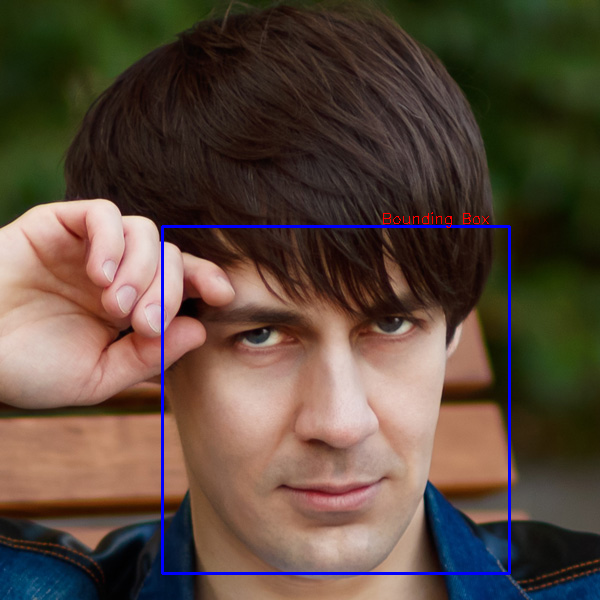

In [ ]:
# accurately detected face
display(Markdown("Correctly detected face"))
test_bb(img_box_df,"training_images/real_00572.jpg",title="Bounding Box")

#### training_images/real_01081.jpg

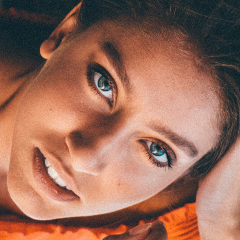

#### training_images/real_00613.jpg

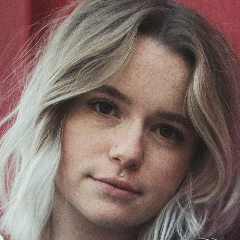

#### training_images/real_00511.jpg

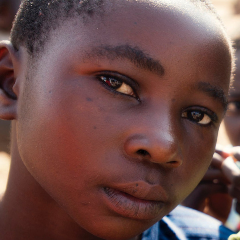

#### training_images/real_00897.jpg

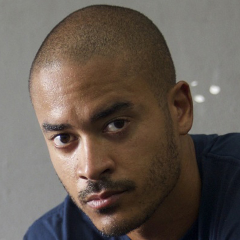

#### training_images/real_00851.jpg

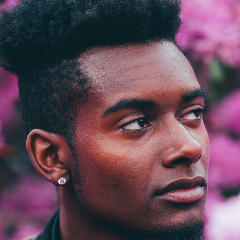

In [ ]:
# sample of undetected faces
show_face(undetected_images[-5:],scale=0.5)

Face not detected

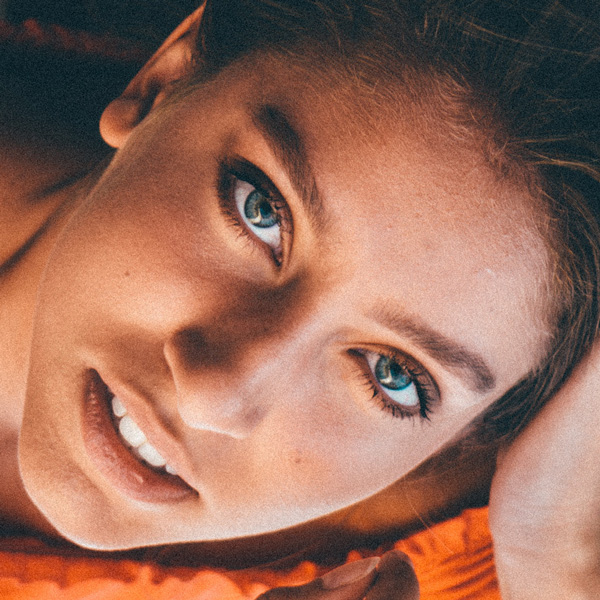

In [ ]:
# undetected face sample
display(Markdown("Face not detected"))
test_bb(img_box_df,"training_images/real_01081.jpg",title="Bounding Box")

#####**4. Save the output Dataframe in .csv format. [2 Marks]**

In [ ]:
img_box_df.to_csv('test_image_metadata5.csv')

####**Summary**
A facial detection model named HAAR was developed for identifying faces. The information related to these identified faces was stored as a dataframe and then exported in .csv format.

## PART C [25 Marks]

### 1. Unzip, read and Load data(‘PINS.zip’) into session. [1 Marks]

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
images_zip_path = '/content/drive/MyDrive/PINS.zip'
from zipfile import ZipFile

with ZipFile(images_zip_path, 'r') as z:
  z.extractall()

### 2. Write function to create metadata of the image. [3Marks]

In [ ]:
import numpy as np
import os

class IdentityMetadata():
    def __init__(self, base, name, file):


        self.base = base

        self.name = name
        # image file name
        self.file = file

    def __repr__(self):
        return self.image_path()

    def image_path(self):
        return os.path.join(self.base, self.name, self.file)

### 3. Write a loop to iterate through each and everyimage and create metadata for all the images. [3 Marks]


In [ ]:
def load_metadata(path):
    metadata = []
    for i in os.listdir(path):
        for f in os.listdir(os.path.join(path, i)):

            ext = os.path.splitext(f)[1]
            if ext == '.jpg' or ext == '.jpeg':
                metadata.append(IdentityMetadata(path, i, f))
    return np.array(metadata)

In [ ]:
# load_metadata to read the images and assign metadata to a variable

metadata = load_metadata('PINS')

In [ ]:
# function to read image using opencv and convert it from BGR to RGB

import cv2
def load_image(path):
    img = cv2.imread(path, 1)
    return img[...,::-1]

In [ ]:
load_image(metadata[0].image_path())

array([[[67, 56, 50],
        [62, 51, 45],
        [56, 45, 39],
        ...,
        [22, 19, 12],
        [22, 19, 12],
        [23, 18, 12]],

       [[65, 54, 48],
        [64, 53, 47],
        [56, 45, 39],
        ...,
        [22, 19, 12],
        [22, 19, 12],
        [23, 18, 12]],

       [[61, 50, 46],
        [59, 48, 44],
        [47, 36, 30],
        ...,
        [23, 18, 12],
        [23, 18, 12],
        [23, 18, 12]],

       ...,

       [[60, 40, 41],
        [60, 40, 41],
        [56, 36, 37],
        ...,
        [30, 21, 16],
        [31, 22, 17],
        [31, 22, 17]],

       [[60, 40, 41],
        [60, 40, 41],
        [57, 37, 38],
        ...,
        [30, 21, 16],
        [31, 22, 17],
        [31, 22, 17]],

       [[61, 41, 42],
        [60, 40, 41],
        [57, 37, 38],
        ...,
        [30, 21, 16],
        [31, 22, 17],
        [31, 22, 17]]], dtype=uint8)

Loading a random image sample

In [ ]:
n = np.random.randint(1, len(metadata))
img_path = metadata[n].image_path()
img = load_image(img_path)

In [ ]:
labels = np.array([meta.name for meta in metadata])

In [ ]:
import matplotlib.pyplot as plt

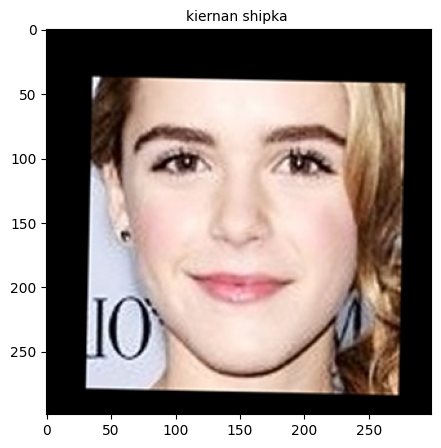

In [ ]:
fig = plt.figure(figsize = (10, 5))
ax = fig.add_subplot(1, 1, 1)
title = labels[n].split('_')[1]
ax.set_title(title, fontsize = 10)
_ = plt.imshow(img)

### 4. Generate Embeddingsvectors on the each face in the dataset. [3 Marks]


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ZeroPadding2D, Convolution2D, MaxPooling2D, Dropout, Flatten, Activation

def vgg_face():
    model = Sequential()
    model.add(ZeroPadding2D((1,1),input_shape=(224,224, 3)))
    model.add(Convolution2D(64, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(Convolution2D(4096, (7, 7), activation='relu'))
    model.add(Dropout(0.5))
    model.add(Convolution2D(4096, (1, 1), activation='relu'))
    model.add(Dropout(0.5))
    model.add(Convolution2D(2622, (1, 1)))
    model.add(Flatten())
    model.add(Activation('softmax'))
    return model

In [ ]:
from tensorflow.keras.models import model_from_json
model = vgg_face()
model.load_weights('/content/drive/MyDrive/CV_GL/vgg_face_weights.h5')

In [ ]:
from tensorflow.keras.models import Model
vgg_face_descriptor = Model(inputs=model.layers[0].input, outputs=model.layers[-2].output)

In [ ]:


img_path = metadata[0].image_path()
img = load_image(img_path)

img = (img / 255.).astype(np.float32)

img = cv2.resize(img, dsize = (224,224))
print(img.shape)

embedding_vector = vgg_face_descriptor.predict(np.expand_dims(img, axis=0))[0]
print(embedding_vector.shape)

(224, 224, 3)
1/1 [==============================] - 0s 281ms/step
(2622,)


- Write code to iterate through metadata and create embeddings for each image using vgg_face_descriptor.predict() and store in a list with name embeddings

- If there is any error in reading any image in the dataset, fill the emebdding vector of that image with 2622-zeroes as the final embedding from the model is of length 2622.

In [ ]:
embeddings = np.zeros((metadata.shape[0], 2622))
k = 0
for i, m in enumerate(metadata):
    try:
        img = load_image(m.image_path())
        if k % 500 == 0:
            print(k)
        # scale RGB values to interval [0,1]
        img = cv2.resize(img, dsize = (224,224))
        img = (img / 255.).astype(np.float32)
        # obtain embedding vector for image
        embeddings[i] = vgg_face_descriptor.predict(np.expand_dims(img, axis=0))[0]
        k += 1
    except Exception as e:
        print(str(e))
        print(i,m)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 17ms/step
6000
1/1 [==============================] - 0s 19ms/step
6500
1/1 [==============================] - 0s 18ms/step
7000
1/1 [==============================] - 0s 19ms/step
7500
1/1 [==============================] - 0s 21ms/step
8000
1/1 [==============================] - 0s 28ms/step
8500
1/1 [==============================] - 0s 27ms/step
9000
1/1 [==============================] - 0s 19ms/step
9500
1/1 [==============================] - 0s 19ms/step
10000
1/1 [==============================] - 0s 21ms/step
10500
1/1 [==============================] - 0s 19ms/step


###  5. Build distancemetrics for identifying the distance betweentwo similar and dissimilar images. [4 Marks]

#### Function to calculate distance between given 2 pairs of images.

- Consider distance metric as "Squared L2 distance"
- Squared l2 distance between 2 points (x1, y1) and (x2, y2) = (x1-x2)^2 + (y1-y2)^2

In [ ]:
def distance(emb1, emb2):
    return np.sum(np.square(emb1 - emb2))

#### Plot images and get distance between the pairs given below
- 2, 3 and 2, 180
- 30, 31 and 30, 100
- 70, 72 and 70, 115

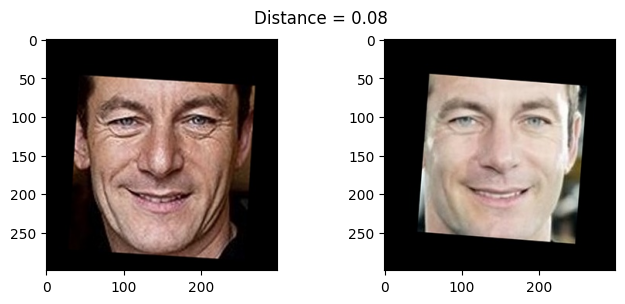

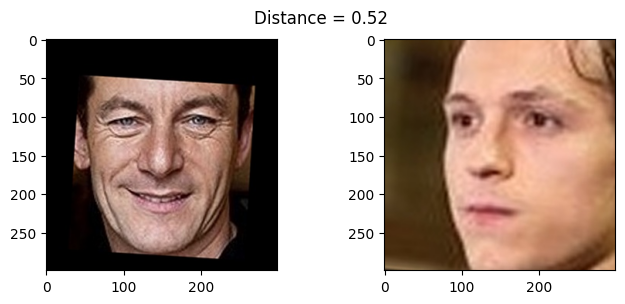

In [ ]:
def show_pair(idx1, idx2):
    plt.figure(figsize=(8,3))
    plt.suptitle(f'Distance = {distance(embeddings[idx1], embeddings[idx2]):.2f}')
    plt.subplot(121)
    plt.imshow(load_image(metadata[idx1].image_path()))
    plt.subplot(122)
    plt.imshow(load_image(metadata[idx2].image_path()));

show_pair(2, 3)
show_pair(2, 180)

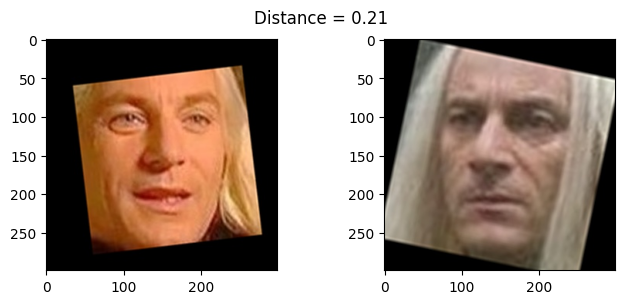

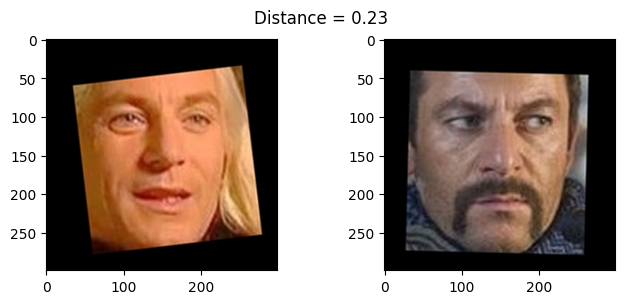

In [ ]:
show_pair(30, 31)
show_pair(30, 100)

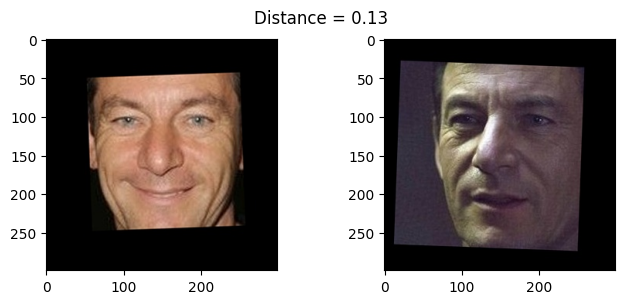

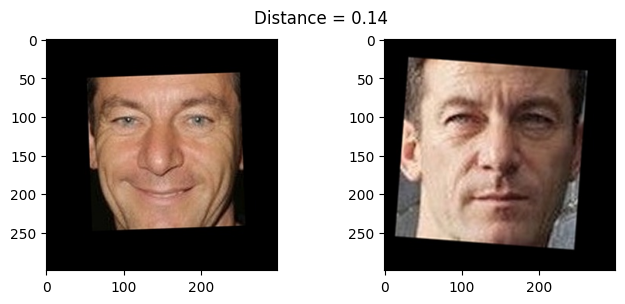

In [ ]:
show_pair(70, 72)
show_pair(70, 115)

###  6. Use PCA for dimensionality reduction. [2 Marks]


- Create X_train, X_test and y_train, y_test
- Use train_idx to seperate out training features and labels
- Use test_idx to seperate out testing features and labels

In [ ]:
train_idx = np.arange(metadata.shape[0]) % 9 != 0
test_idx = np.arange(metadata.shape[0]) % 9 == 0

X_train = embeddings[train_idx]
X_test = embeddings[test_idx]

targets = np.array([m.name for m in metadata])
y_train = targets[train_idx]
y_test = targets[test_idx]

- Encode the targets
- Use LabelEncoder

In [ ]:
from sklearn.preprocessing import LabelEncoder


encoder = LabelEncoder()


y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

- Scale the features using StandardScaler

In [ ]:

from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

- Reduce feature dimensions using Principal Component Analysis
- Set the parameter n_components=128

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=128, svd_solver='randomized', whiten=True)

X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

###  7. Build an SVM classifier in order to map each image to its right person. [4 Marks]


 - Train the SVM classifier and print the score

In [ ]:
from sklearn.svm import SVC

In [ ]:
clf = SVC(kernel = 'rbf', C = 1, gamma = 0.001, class_weight = 'balanced', random_state = 1)
clf.fit(X_train, y_train)
print('SVC accuracy for train set: {0:.3f}'.format(clf.score(X_train, y_train)))

SVC accuracy for train set: 0.975


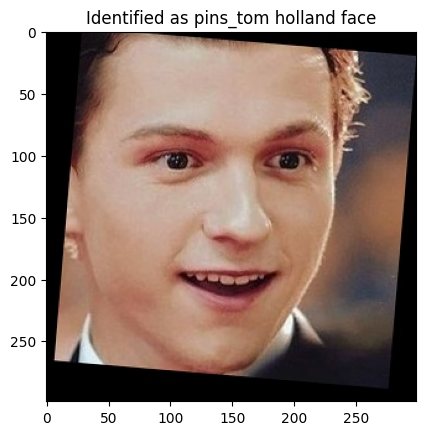

In [ ]:
# showing a random image label
n = np.random.randint(1, len(metadata))
sample_idx = n

sample_image = load_image(metadata[test_idx][sample_idx].image_path())
sample_prediction = clf.predict([X_test[sample_idx]])
sample_identity = encoder.inverse_transform(sample_prediction)[0]

plt.imshow(sample_image)
plt.title(f'Identified as {sample_identity}');

### 8. Import and display the the test images. [1 Marks]


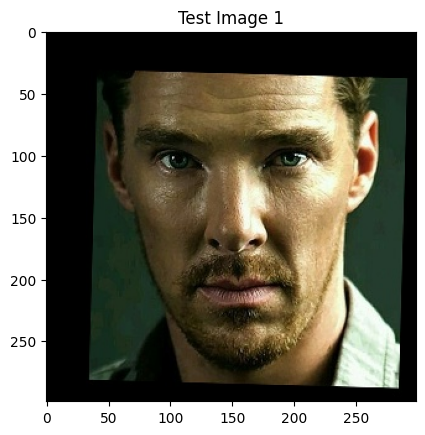

In [ ]:
# Load image
image_path = "/content/drive/MyDrive/CV_GL/Benedict_Cumberbatch.jpg"
img1 = load_image(image_path)

# Displaying image using matplotlib
plt.imshow(img1)
plt.title("Test Image 1")
plt.show()

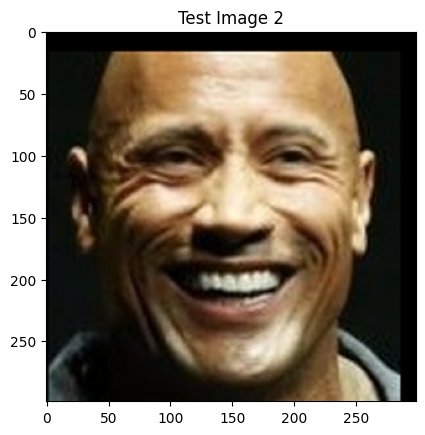

In [ ]:
# Load image
image_path = "/content/drive/MyDrive/CV_GL/Dwayne_Johnson.jpg"
img2 = load_image(image_path)

# Displaying image using matplotlib
plt.imshow(img2)
plt.title("Test Image 2")
plt.show()

### 9. Use the trained SVM modelto predictthe face on both test images. [4 Marks]

In [ ]:
def pred_face(img_path):
  img = cv2.imread(img_path)
  img = load_image(img_path)
  img = (img / 255.).astype(np.float32)
  img = cv2.resize(img, dsize = (224,224))
  ev = vgg_face_descriptor.predict(np.expand_dims(img, axis=0))[0]
  ev = ev.reshape(1, -1)
  ev = sc.transform(ev)
  ev = pca.transform(ev)
  result = clf.predict(ev)
  identity = encoder.inverse_transform(result)[0]
  plt.imshow(img)
  plt.title(f'Identified as {identity}');

1/1 [==============================] - 0s 58ms/step


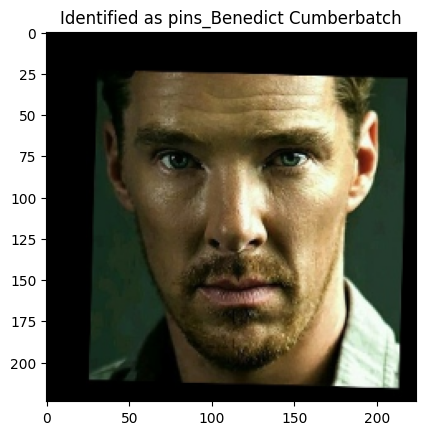

In [ ]:
test_img =  "/content/drive/MyDrive/CV_GL/Benedict_Cumberbatch.jpg"
pred_face(test_img)

1/1 [==============================] - 0s 43ms/step


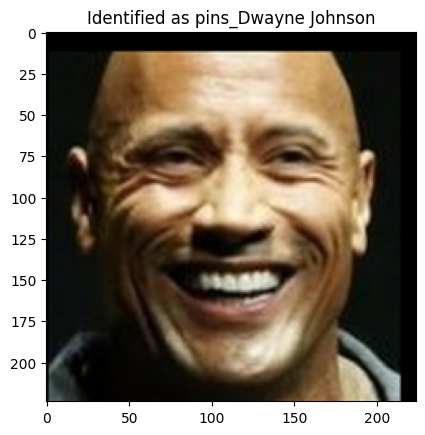

In [ ]:
test_img =  "/content/drive/MyDrive/CV_GL/Dwayne_Johnson.jpg"
pred_face(test_img)

###**Summary**
Utilizing a VGG model with pre-existing weights, embedding vectors for dataset images were generated. These vectors facilitated distance calculations between various pairs. With each image containing 2622 features, PCA was employed to minimize dimensionality. Subsequently, an SVM classifier was constructed to accurately associate each image with its corresponding individual. Achieving a training set accuracy of 97.5%, the model successfully identified the names of images within the test images.

In [ ]:
#@title Convert ipynb to HTML in Colab
# Upload ipynb
from google.colab import files
f = files.upload()

# Convert ipynb to html
import subprocess
file0 = list(f.keys())[0]
_ = subprocess.run(["pip", "install", "nbconvert"])
_ = subprocess.run(["jupyter", "nbconvert", file0, "--to", "html"])

# download the html
files.download(file0[:-5]+"html")

Saving banothusureshnaik777.ipynb to banothusureshnaik777.ipynb


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>